<h1> <center><font color='green' > <b>AGN Image Classification for SDSS</b></font> </center></h1>

# Data preprocessing
by Sicong Huang <br> \
<font color='blue'>Python Version: 3 <br>
SDSS Version: DR8

# THE QUESTION:
# <font color='green'>How to prepare the data ?

# GOAL of the project:
## <font color='green'> Use images to classify AGN. Compare results with AGN_Classifer. Maybe combine those 2 to improve the final results of AGN classification.

# Analytic Approach:
# <font color='green'> Shallow CNN or ResNet

# IMPORT LIBRARIES

In [2]:
# System
import os
from io import BytesIO
from tqdm import tqdm
import h5py

# Web Scraping
from astroquery.simbad import Simbad
from urllib.parse import quote
from urllib import request

# Data Analysis
from astropy.io import fits
import pandas as pd
import numpy as np
from astropy.io import fits
from astropy.coordinates import SkyCoord
from astropy.visualization import astropy_mpl_style

# Data Visualization
import ipyplot
from PIL import Image
import matplotlib.pyplot as plt
plt.style.use(astropy_mpl_style)
from astropy.visualization import (MinMaxInterval, SqrtStretch, AsinhStretch,
                                   ImageNormalize)

%matplotlib inline

# Functions

In [3]:
def combine_columns(df, column_names):
    '''
    This function merges the columns 
    with first come first serve order
    and returns a new df series
    '''
    col = df[column_names[0]]
    for name in column_names[1:]:
        col = col.combine_first(df[name])
    return col

# Data Requirements:
## <font color='green'>Image of each labeled source in SDSS DR8

# Data Collection:
<font color='green'> Image can be obtained from http://alasky.u-strasbg.fr/hips-image-services/hips2fits <br>
<font color='green'> Catalog can be obtained from http://skyserver.sdss.org/dr8/en/tools/search/sql.asp <br>
    


SELECT TOP 15000 <br>
    sp.objid,sp.ra,sp.dec,sp.class <br>
FROM SpecPhoto AS sp <br>
    WHERE sp.class = 'QSO'

In [6]:
# Image directory
Image_path = '/data/blackbase/Images/'

# SDSS tables
sdss_qso = Image_path+"sdss_qso.csv"
sdss_gal = Image_path+"sdss_gal.csv"
sdss_star = Image_path+"sdss_star.csv"

In [7]:
# combine csv files into 1 file
combined_csv = pd.concat([pd.read_csv(f) for f in [sdss_qso, sdss_gal, sdss_star] ])
combined_csv.to_csv(Image_path+"sdss.csv", index=False, encoding='utf-8-sig')

## <font color='green'> Read coordinates for labeled data 

In [8]:
df_sdss = pd.read_csv(Image_path+"sdss.csv")

In [9]:
df_sdss.head()

,objid,ra,dec,class
0,1237662503217660113,233.44155,37.661665,QSO
1,1237662503217659994,233.49061,37.635551,QSO
2,1237662503217725534,233.49831,37.617841,QSO
3,1237662503217660106,233.45622,37.680071,QSO
4,1237661465985155150,233.75955,37.223522,QSO


In [10]:
df_sdss.dtypes

objid      int64
ra       float64
dec      float64
class     object
dtype: object

In [11]:
# Classification counts
df_sdss['class'].value_counts()

QSO       15000
GALAXY    10000
STAR       5000
Name: class, dtype: int64

In [12]:
# create a small sample of 60 QSOs, galaxies and stars 
# for visual inspection of the images
df_qso = df_sdss[df_sdss['class']=='QSO'][:60]
df_gal = df_sdss[df_sdss['class']=='GALAXY'][:60]
df_star = df_sdss[df_sdss['class']=='STAR'][:60]

In [8]:
# replace classes with AGN and non-AGN
# df_coord.rename(columns = {'best_class':'AGN'}, inplace = True)
# df_coord['AGN'].replace({'generic_agn':True,
#                    'blazar':True,
#                    'star':False,
#                    'galaxy':False,
#                    'type1':True,
#                    'type2':True
#                     }, inplace=True)

In [13]:
# change the lables to 
#  QSO:0-GALAXY:1-STAR:2
df_sdss['class'].replace({'QSO':0,
                   'GALAXY':1,
                   'STAR':2}, inplace=True)

In [14]:
df_sdss['class'] = df_sdss['class'].astype(int)
df_sdss['class'].value_counts()

0    15000
1    10000
2     5000
Name: class, dtype: int64

## <font color='green'>Train/dev set split
Train/dev ratio = 0.8/0.2 <br>
Set Train size = 24000 & Dev size = 6000

In [15]:
df_train, df_dev = np.split(df_sdss.sample(n=30000, random_state=123), [int(.8*30000)])

In [16]:
# reset index
df_train = df_train.reset_index(drop=True)
df_dev = df_dev.reset_index(drop=True)

In [17]:
df_train.columns

Index(['objid', 'ra', 'dec', 'class'], dtype='object')

In [18]:
df_train.to_csv('train_sdss.csv', header=['objid', 'ra', 'dec', 'class'], index=False)
df_dev.to_csv('dev_sdss.csv', header=['objid', 'ra', 'dec', 'class'], index=False)

## <font color='green'>Setup image size, list of objects, list of HiPS

In [19]:
# The file size of a 150x150 jpg file is ~ 8kb, with 1 mil images ~ 8gb
width = 64
height = 64
fov = 0.05 # in decimal degrees

# hips observations, use DSS2/red for now
# SEE https://aladin.u-strasbg.fr/hips/list
#hips_list = ['DSS2/red', 'CDS/P/AKARI/FIS/N160', 'PanSTARRS/DR1/z', '2MASS/J', 'AllWISE/W3']
hips = 'DSS2/color'

# nb_obj = len(objects)
# nb_hips = len(hips_list)

## <font color='green'> Query hips2fits service 
    Notice that the images are in grey scale so only 1 channel is needed, while RBG images need all 3 channels.

100%|██████████| 59/59 [00:25<00:00,  2.30it/s]


QSO:



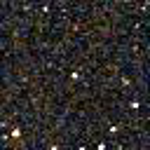
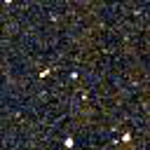
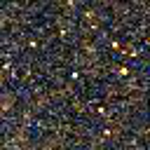
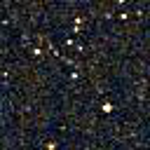
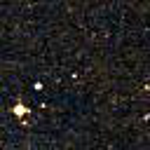
...
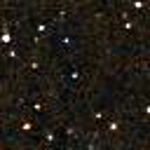
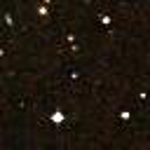
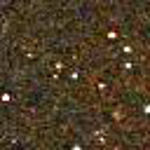
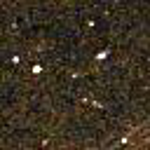
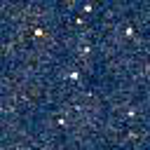

In [60]:
# QSO images
ras = df_qso['ra'].to_numpy()
decs = df_qso['dec'].to_numpy()
labels = df_qso['objid'].to_list()
url = f'http://alasky.u-strasbg.fr/hips-image-services/hips2fits?hips={quote(hips)}&width={width}&height={height}&fov={fov}&projection=TAN&coordsys=icrs&ra={ras[0]}&dec={decs[0]}&format={"jpg"}'
res = request.urlopen(url).read()
img = Image.open(BytesIO(res))
data = np.asarray(img)
#data = data[:,:,0]
data = data.reshape(1,data.shape[0], data.shape[1], data.shape[2])

for i in tqdm(range(1,len(ras))):
    ra = ras[i]
    dec = decs[i]
    url = f'http://alasky.u-strasbg.fr/hips-image-services/hips2fits?hips={quote(hips)}&width={width}&height={height}&fov={fov}&projection=TAN&coordsys=icrs&ra={ra}&dec={dec}&format={"jpg"}'
    res = request.urlopen(url).read()
    img = Image.open(BytesIO(res))
    data1 = np.asarray(img)
    #data1 = data1[:,:,0]
    data1 = data1.reshape(1,data1.shape[0], data1.shape[1], data1.shape[2])
    data = np.concatenate((data, data1), axis=0)
    
print("QSO:")
ipyplot.plot_images(data, labels=labels, max_images=60, img_width=150)

100%|██████████| 59/59 [00:25<00:00,  2.31it/s]


GALAXY:



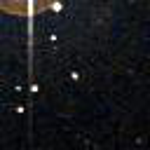
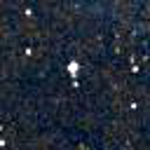
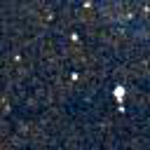
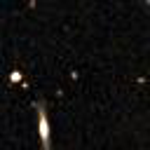
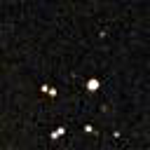
...
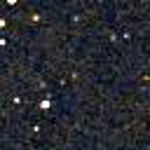
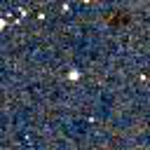
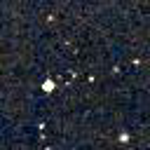
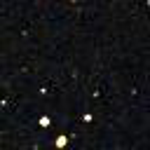
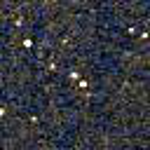

In [61]:
# Galaxy images
ras = df_gal['ra'].to_numpy()
decs = df_gal['dec'].to_numpy()
labels = df_gal['objid'].to_list()
url = f'http://alasky.u-strasbg.fr/hips-image-services/hips2fits?hips={quote(hips)}&width={width}&height={height}&fov={fov}&projection=TAN&coordsys=icrs&ra={ras[0]}&dec={decs[0]}&format={"jpg"}'
res = request.urlopen(url).read()
img = Image.open(BytesIO(res))
data = np.asarray(img)
#data = data[:,:,0]
data = data.reshape(1,data.shape[0], data.shape[1], data.shape[2])

for i in tqdm(range(1,len(ras))):
    ra = ras[i]
    dec = decs[i]
    url = f'http://alasky.u-strasbg.fr/hips-image-services/hips2fits?hips={quote(hips)}&width={width}&height={height}&fov={fov}&projection=TAN&coordsys=icrs&ra={ra}&dec={dec}&format={"jpg"}'
    res = request.urlopen(url).read()
    img = Image.open(BytesIO(res))
    data1 = np.asarray(img)
    #data1 = data1[:,:,0]
    data1 = data1.reshape(1,data1.shape[0], data1.shape[1], data1.shape[2])
    data = np.concatenate((data, data1), axis=0)
    
print("GALAXY:")
ipyplot.plot_images(data, labels=labels, max_images=60, img_width=150)

100%|██████████| 59/59 [00:25<00:00,  2.33it/s]


GALAXY:



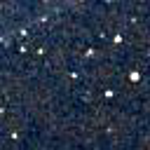
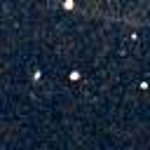
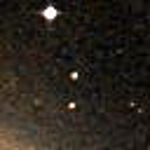
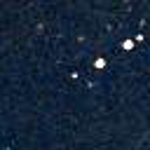
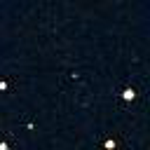
...
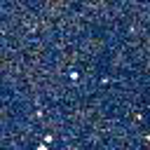
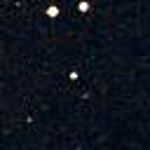
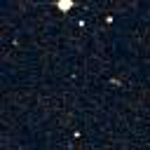
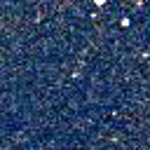
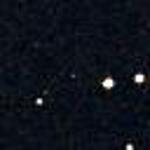

In [62]:
# Star images
ras = df_star['ra'].to_numpy()
decs = df_star['dec'].to_numpy()
labels = df_star['objid'].to_list()
url = f'http://alasky.u-strasbg.fr/hips-image-services/hips2fits?hips={quote(hips)}&width={width}&height={height}&fov={fov}&projection=TAN&coordsys=icrs&ra={ras[0]}&dec={decs[0]}&format={"jpg"}'
res = request.urlopen(url).read()
img = Image.open(BytesIO(res))
data = np.asarray(img)
#data = data[:,:,0]
data = data.reshape(1,data.shape[0], data.shape[1], data.shape[2])

for i in tqdm(range(1,len(ras))):
    ra = ras[i]
    dec = decs[i]
    url = f'http://alasky.u-strasbg.fr/hips-image-services/hips2fits?hips={quote(hips)}&width={width}&height={height}&fov={fov}&projection=TAN&coordsys=icrs&ra={ra}&dec={dec}&format={"jpg"}'
    res = request.urlopen(url).read()
    img = Image.open(BytesIO(res))
    data1 = np.asarray(img)
    #data1 = data1[:,:,0]
    data1 = data1.reshape(1,data1.shape[0], data1.shape[1], data1.shape[2])
    data = np.concatenate((data, data1), axis=0)
    
print("Star:")
ipyplot.plot_images(data, labels=labels, max_images=60, img_width=150)

## <font color='red'>Visual Inspection Conclusion:
It seems that Galaxy images are a little more different than QSOs and stars. Maybe try classifyig qsos from galaxies and stars and then galaxies from qsos and stars and evaluate.

## <font color='green'>Save image data for train/dev to file 

In [94]:
# os.remove(Image_path+'train_sdss.h5')
# os.remove(Image_path+'dev_sdss.h5')

In [20]:
dic = {'dev': df_dev, 'train': df_train}
for name, df in dic.items():
    # get ra and dec list
    idx = df['objid'].to_numpy()
    ras = df['ra'].to_numpy()
    decs = df['dec'].to_numpy()
    agns = df['class'].to_numpy()

    # initialize the image numpy array with shape: (sample_size, width, height, channel)
    url = f'http://alasky.u-strasbg.fr/hips-image-services/hips2fits?hips={quote(hips)}&width={width}&height={height}&fov={fov}&projection=TAN&coordsys=icrs&ra={ras[0]}&dec={decs[0]}&format={"jpg"}'
    res = request.urlopen(url).read()
    img = Image.open(BytesIO(res))
    data = np.asarray(img)
    #data = data[:,:,0]
    data = data.reshape(1,data.shape[0], data.shape[1], data.shape[2])

    # loop through the whole datasets starting from index=1
    for i in tqdm(range(1,len(ras))):
        ra = ras[i]
        dec = decs[i]
        url = f'http://alasky.u-strasbg.fr/hips-image-services/hips2fits?hips={quote(hips)}&width={width}&height={height}&fov={fov}&projection=TAN&coordsys=icrs&ra={ra}&dec={dec}&format={"jpg"}'
        res = request.urlopen(url).read()
        img = Image.open(BytesIO(res))
        data1 = np.asarray(img)
        #data1 = data1[:,:,0] # only need the 1st channel for grey scale images
        data1 = data1.reshape(1,data1.shape[0], data1.shape[1], data1.shape[2])
        data = np.concatenate((data, data1), axis=0)
        
    h5f = h5py.File(Image_path+f'{name}_sdss.h5', 'w')
    dset1 = h5f.create_dataset(f"{name}_set_x", data=data)
    dset2 = h5f.create_dataset(f"{name}_set_y", data=agns)
    h5f.close()

100%|██████████| 23999/23999 [3:57:20<00:00,  1.69it/s]   


In [21]:
print(f"Train file size: {os.path.getsize(Image_path+'train_sdss.h5')/(1024*1024):.2f} mb")
print(f"Dev file size: {os.path.getsize(Image_path+'dev_sdss.h5')/(1024*1024):.2f} mb")

Train file size: 281.44 mb
Dev file size: 70.36 mb


## Data Issues
<ul>
  <font color='green'><li>Hard to differentiate images visually</li></font>    
  <font color='green'><li>Possible mislabeling problems</li></font>    
  <font color='green'><li>6000 images in total. Maybe not enough.</li></font>    
  <font color='green'><li>Larger amount of images streaming from hips2 may cause overflow from website</li></font>
</ul>